# 1st Set of Excercises

- Name: **Voulgari Despoina**

- ID: **7115152400012**

- Subject: **Image Analysis & Process**

In [1]:
# Import necessary libraries
from PIL import Image
from IPython.display import display 
import cv2
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
import math
from scipy import ndimage
import scipy.ndimage as ndi

---
---

# **Exercise 1**  

## a) Explain the impact of the following transformation function on a grayscale image, in terms of intensity values and brightness.

This transformation function maps ranges of input intensity values to new, smaller set of discrete output intensity values, with the following function:

$$
\begin{equation}
f(x) = \begin{cases}
10 & 0 \leq x < 30 \\
20 & 30 \leq x < 60 \\
50 & 60 \leq x < 90 \\
70 & 90 \leq x < 120 \\
100 & 120 \leq x < 160 \\
140 & 160 \leq x < 190 \\
180 & 190 \leq x < 220 \\
200 & 220 \leq x \leq 255 \
\end{cases}
\end{equation}
$$

* **Intensity Values:** The function compresses the original 256 possible intensity levels into 8 distinct output levels (approximately 10, 20, 50, 70, 100, 140, 180 and 200). This means that a range of input pixel intensities will be mapped to a single output intensity.

* **Brightness:** The overall effect on the image's brightness depends on the distribution of intensity values in the original image.
    * Input intensities in the lower range (0-30) remain relatively dark.
    * Mid-range input intensities are mapped to intermediate output values, potentially leading to a loss of subtle tonal variations.
    * Higher input intensities are mapped to brighter output values, but again, with a reduction in the number of distinct bright levels.

In essence, this transformation reduces the number of distinct intensity levels in the image, leading to a **posterization** effect or a reduction in the image's tonal range. Subtle details and smooth transitions in brightness will be lost, and the image will appear to have fewer distinct shades of gray. (pixles that differ $\approx 30$ in intensity/brightness will be assigned the same lower intensity/brightness value)

## b) Verify your answer by a applying the transformation on an image of your choice (include input/output images in your answer) 

Define a function that does the appropriate transformation

In [2]:
def image_transformation(image):
    # Define the mapping from input intensity ranges to output levels.
    bins = [0, 30, 60, 90, 120, 160, 190, 220, 256] # Input intensity levels
    levels = [10, 20, 50, 70, 100, 140, 180, 200]  # Output intensity levels

    # Use numpy.digitize to map pixel values to the correct bin index.
    # Subtract 1 from the result because bins are 1-indexed, but levels are 0-indexed.
    indices = np.digitize(image, bins) - 1

    # Handle edge case where values are exactly 256.  np.digitize assigns 256 to bin 8, which is out of bounds for levels.  We want it in the last level.
    indices[indices == len(levels)] = len(levels) - 1

    # Create the transformed image by mapping each pixel to its corresponding level.
    transformed_image_image = np.array([levels[i] for i in indices.flatten()]).reshape(image.shape)

    return transformed_image_image

Use it to the example:

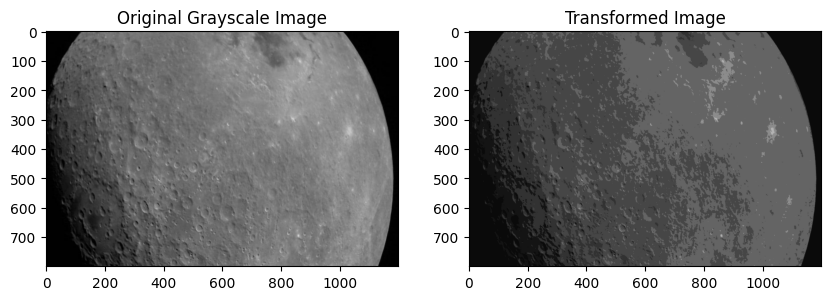

In [3]:
if __name__ == '__main__':
    # Read the image
    image_moon = cv2.imread("First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg")
    # Apply the function
    transformed_image = image_transformation(image_moon)

    # Display the original and transformed images side by side
    import matplotlib.pyplot as plt
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image_moon, cmap='gray')
    plt.title('Original Grayscale Image')
    plt.subplot(1, 2, 2)
    plt.imshow(transformed_image, cmap='gray')
    plt.title('Transformed Image')
    plt.show()

The transformation applied to the original grayscale image appears to have increased the contrast, making the darker regions appear even darker and the lighter regions brighter. This enhancement highlights the surface features, such as craters and variations in terrain, more distinctly in the transformed image.

---
---

# **Exercise 2**

## Propose a method for enhancing the image “nature_dark_forest.jpg” in terms of the perceived light and color. 

Display the original image:

This code performs the following:

* Loads the image.

* Applies `color correction`.

* Using `CLAHE` (Contrast Limited Adaptive Histogram Equalization): This will enhance the details in the dark and bright areas of the image without overdoing the brightness.

* Adjusts brightness using `gamma correction`.

* Enhances `saturation`: This will make the colors richer.

* Display histograms.

* Displays the original and enhanced images, along with intermediate steps, to visualize the process.

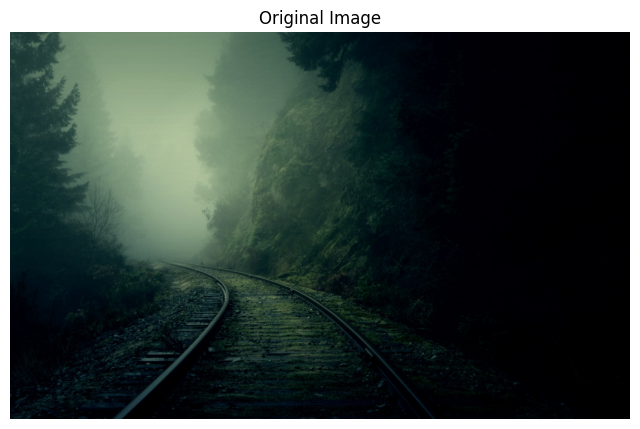

In [4]:
# Load the image
image_path_2 = "nature_dark_forest.jpg"
image_forest = cv2.imread(image_path_2)
if image_forest is None:
    raise ValueError(f"Could not read image at {image_path_2}")

# Display the original image
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(image_forest, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB for matplotlib
plt.title("Original Image")
plt.axis('off')
plt.show()

The color_correct function aims to adjust the color balance by scaling the color channels based on their mean values.

In [5]:
def color_correct(img):
    """
    Corrects the color balance of an image by scaling the color channels.

    Args:
        img (numpy.ndarray): The input image (BGR format).

    Returns:
        numpy.ndarray: The color-corrected image (BGR format).
    """
    b, g, r = cv2.split(img)
    b_mean = cv2.mean(b)[0]
    g_mean = cv2.mean(g)[0]
    r_mean = cv2.mean(r)[0]
    max_avg = max(b_mean, g_mean, r_mean)
    b_scale = max_avg / b_mean
    g_scale = max_avg / g_mean
    r_scale = max_avg / r_mean
    b = cv2.convertScaleAbs(b, alpha=b_scale)
    g = cv2.convertScaleAbs(g, alpha=g_scale)
    r = cv2.convertScaleAbs(r, alpha=r_scale)
    img = cv2.merge((b, g, r))
    return img

# Apply color correction
img_color_corrected = color_correct(image_forest.copy())  # Create a copy to preserve the original


CLAHE enhances local contrast, which is crucial for bringing out details in the dark forest scene.

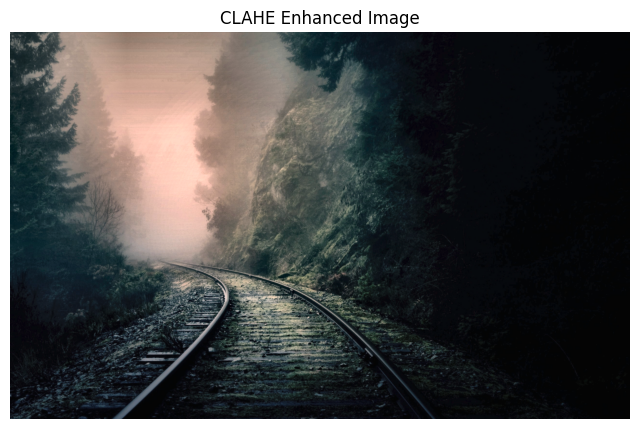

In [6]:
# Convert to LAB color space
img_lab = cv2.cvtColor(img_color_corrected, cv2.COLOR_BGR2LAB)
l_channel, a_channel, b_channel = cv2.split(img_lab)

# Apply CLAHE to the L channel
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
cl_enhanced = clahe.apply(l_channel)

# Merge the enhanced L channel with the original A and B channels
img_lab_enhanced = cv2.merge((cl_enhanced, a_channel, b_channel))
img_clahe = cv2.cvtColor(img_lab_enhanced, cv2.COLOR_LAB2BGR)

plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB))
plt.title("CLAHE Enhanced Image")
plt.axis('off')
plt.show()

Gamma correction adjusts the overall brightness of the image.

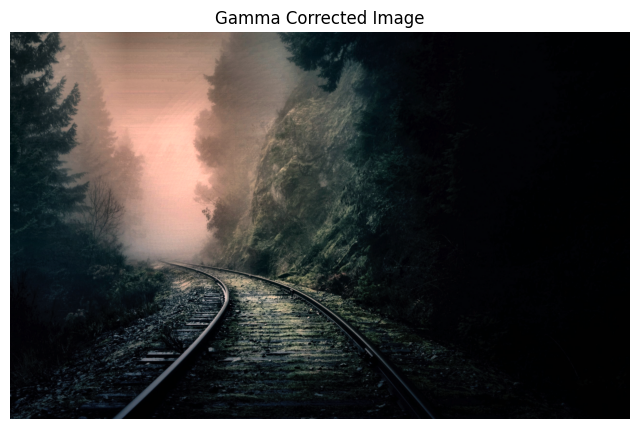

In [7]:
def adjust_gamma(image, gamma):
    """
    Applies gamma correction to a grayscale image.

    Args:
        image (numpy.ndarray): The input grayscale image.
        gamma (float): Gamma value.

    Returns:
        numpy.ndarray: The gamma-corrected image.
    """
    # build a lookup table mapping the pixel values [0, 255] to
    # their adjusted gamma values
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
        for i in np.arange(0, 256)]).astype("uint8")

    # apply gamma correction using the lookup table
    return cv2.LUT(image, table)

# Apply gamma correction
img_gamma_corrected = adjust_gamma(img_clahe.copy(), gamma=0.8)

# Display the gamma corrected image
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_gamma_corrected, cv2.COLOR_BGR2RGB))
plt.title("Gamma Corrected Image")
plt.axis('off')
plt.show()

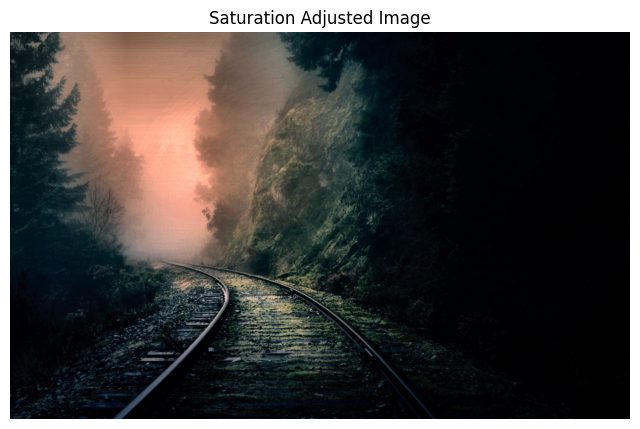

In [8]:
def adjust_saturation(image, factor=1.3):
    """
    Adjusts the color saturation of an image.

    Args:
        image (numpy.ndarray): The input image (BGR format).
        factor (float): The saturation adjustment factor (greater than 1 for increased saturation).

    Returns:
        numpy.ndarray: The saturation-adjusted image (BGR format).
    """
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    s = np.clip(s * factor, 0, 255).astype(np.uint8)
    hsv_adjusted = cv2.merge((h, s, v))
    return cv2.cvtColor(hsv_adjusted, cv2.COLOR_HSV2BGR)

# Apply saturation adjustment
img_saturated = adjust_saturation(img_gamma_corrected.copy(), factor=1.3)

# Display the saturated image
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_saturated, cv2.COLOR_BGR2RGB))
plt.title("Saturation Adjusted Image")
plt.axis('off')
plt.show()

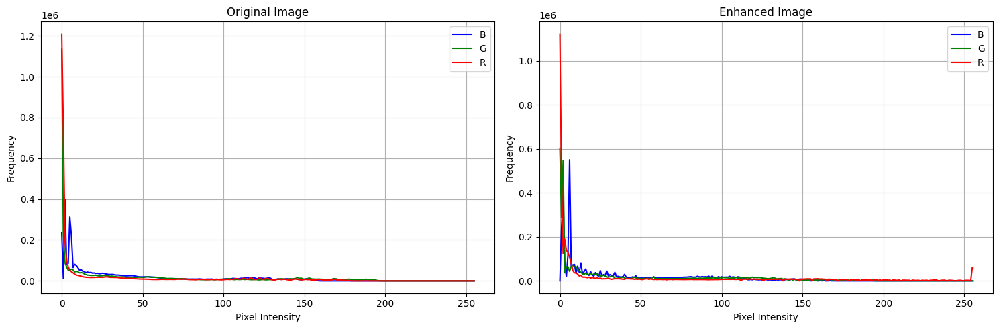

In [9]:
def plot_histograms(image1, image2, title1, title2):
    """
    Plots the histograms of the color channels of two images side by side.

    Args:
        image1 (numpy.ndarray): The first input image (BGR format).
        image2 (numpy.ndarray): The second input image (BGR format).
        title1 (str): The title for the first image.
        title2 (str): The title for the second image.
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 2 columns

    colors = ('b', 'g', 'r')
    for i, color in enumerate(colors):
        hist1 = cv2.calcHist([image1], [i], None, [256], [0, 256])
        hist2 = cv2.calcHist([image2], [i], None, [256], [0, 256])
        axes[0].plot(hist1, color=color, label=f'{color.upper()}')
        axes[1].plot(hist2, color=color, label=f'{color.upper()}')

    axes[0].set_xlabel('Pixel Intensity')
    axes[0].set_ylabel('Frequency')
    axes[0].set_title(title1)
    axes[0].legend()
    axes[0].grid(True)

    axes[1].set_xlabel('Pixel Intensity')
    axes[1].set_ylabel('Frequency')
    axes[1].set_title(title2)
    axes[1].legend()
    axes[1].grid(True)

    plt.tight_layout() 
    plt.show()

# Plot histograms for original and enhanced images side by side
plot_histograms(image_forest, img_saturated, "Original Image", "Enhanced Image")

**Original Image:**

- The histogram for the original image shows a very strong peak at the far left of the intensity scale. This indicates that a large number of pixels have very low intensity values, making the image predominantly dark.

- The blue, green, and red channels all exhibit this strong leftward skew, confirming that the darkness is present across all color components.

- While there are some values present across the intensity range, the distribution is heavily concentrated in the lower values, suggesting low contrast and a lack of detail in the brighter areas.

**Enhanced Image:**

- The histogram for the enhanced image shows that the intensity values are more spread out compared to the original image. The very high peak on the left side is significantly reduced.

- The distribution of pixel intensities is broader, indicating that there are more pixels with mid-range and higher intensity values. This suggests that the enhancement process has made the image brighter overall.

- The distribution is still somewhat uneven, but the shift towards the right indicates increased contrast, meaning there's a greater difference between the darkest and brightest parts of the image.

**Overall:**

The enhanced image has a wider distribution of intensity values, indicating increased brightness and contrast compared to the original image. The original image is heavily concentrated in the dark areas, while the enhanced image utilizes a larger portion of the intensity range.

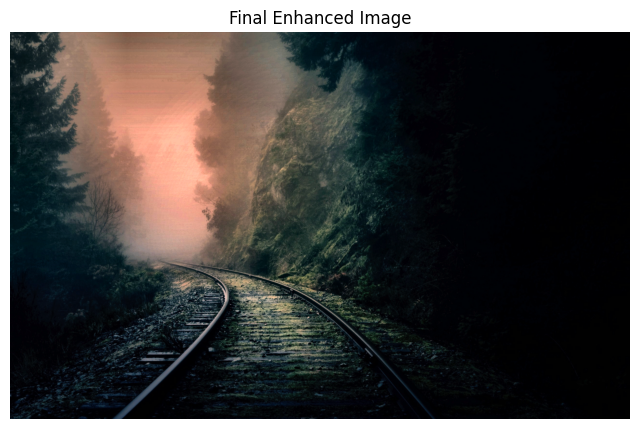

In [10]:
# Display the final enhanced image
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_saturated, cv2.COLOR_BGR2RGB))
plt.title("Final Enhanced Image")
plt.axis('off')
plt.show()

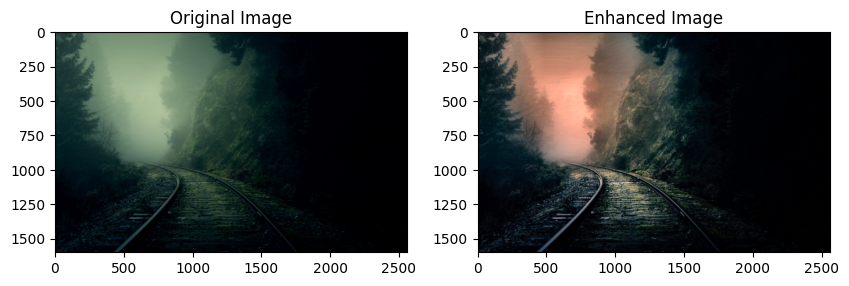

In [11]:
# Display the original and enhanced images side by side
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv2.imread(image_path_2), cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_saturated, cv2.COLOR_BGR2RGB))
plt.title('Enhanced Image')
plt.show()

- The enhanced image is significantly **brighter**, with **improved visibility** across the scene.

- The color tone is warmer, with a noticeable shift towards reds and oranges, particularly in the foggy areas.

- Contrast is increased, revealing more details in the tracks, foliage, and surrounding environment.

- The colors are more saturated, making the scene appear more vibrant and visually appealing.



---
---

# **Exercise 3**

## Propose a method for improving the image “pollen-500x430px-96dpi.jpg” in terms the perceived brightness.  

First step is to load and display it as in the previous exercises.

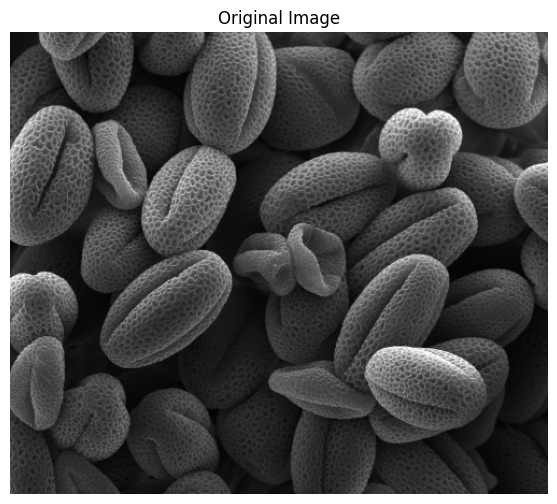

In [12]:
# Load the image
image_path_3 = "pollen-500x430px-96dpi.jpg"
image_pollen = cv2.imread(image_path_3)
if image_pollen is None:
    raise ValueError(f"Could not read image at {image_path_3}")

# Display the original image
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(image_pollen, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB for matplotlib
plt.title("Original Image")
plt.axis('off')
plt.show()

In [13]:
print("The original image is in the BRG color space, with shape:", image_pollen.shape)
print("Pixel values are all equal across channels? ",(image_pollen[:,:,0].all() == image_pollen[:,:,1].all()  == image_pollen[:,:,2].all()))

The original image is in the BRG color space, with shape: (430, 500, 3)
Pixel values are all equal across channels?  True


To improve the perceived brightness, we can employ the following techniques:

Gamma Correction:

Gamma correction is a non-linear operation that adjusts the overall brightness of an image.

For images that appear dark, like the pollen image, applying a gamma value less than 1 will brighten the image. A common value to start with is 0.8.

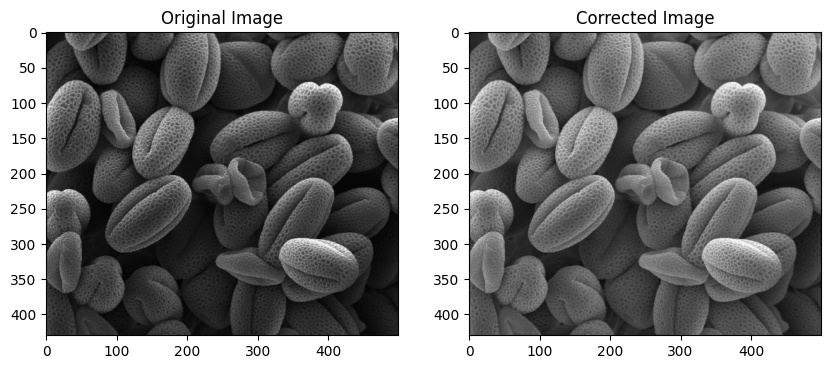

In [14]:
# Load the image
image = cv2.imread('pollen-500x430px-96dpi.jpg', cv2.IMREAD_GRAYSCALE)  # Load as grayscale

# Apply gamma correction
gamma_corrected_image = adjust_gamma(image, gamma=1.5)  # Gamma < 1 brightens

# Display the original and enhanced images side by side
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv2.imread(image_path_3), cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(gamma_corrected_image, cv2.COLOR_BGR2RGB))
plt.title('Corrected Image')
plt.show()

---
---

# **Exercise 4**

## Propose a method for sharpening the image “First-photo-of-the-moon-from-Chandrayaan2_ISRO.jpg”. 

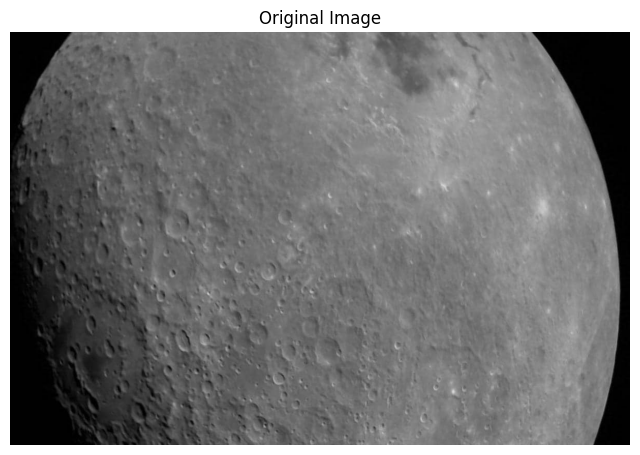

In [15]:
# Load the image
image_path_4 = "First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg"
image_moon = cv2.imread(image_path_4)

# Display the original image
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(image_moon, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB for matplotlib
plt.title("Original Image")
plt.axis('off')
plt.show()

**Step 1: Apply Unsharp Masking**

This step applies the unsharp masking technique to enhance the edges and fine details of the image. Unsharp masking involves:

1.  Creating a blurred version of the original image.
2.  Subtracting the blurred version from the original image to extract the high-frequency components (edges).
3.  Adding a weighted version of the extracted edges back to the original image.

The `unsharp` function defines the kernel used for this process.  The `alpha` parameter controls the strength of the sharpening effect.  A higher `alpha` results in more pronounced sharpening.  The code applies this filter using `cv2.filter2D` with two different `alpha` values (0.1 and 0.5) to demonstrate the effect of this parameter.  The results are then displayed alongside the original image for visual comparison.


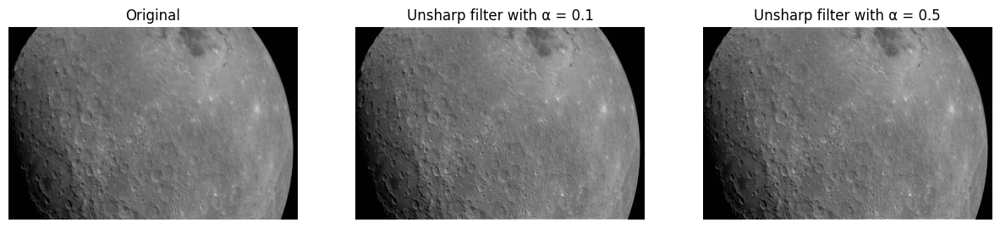

In [16]:
def unsharp(alpha=0.1):
    """
    Applies an unsharp masking kernel.

    Args:
        alpha (float, optional): The weighting factor for the edge detection kernel. Defaults to 0.1.

    Returns:
        numpy.ndarray: The unsharp masking kernel.
    """
    A1 = np.array([[-1,1,-1],[1,1,1],[-1,1,-1]])
    A2 = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
    return (alpha*A1+A2)/(alpha+1)


fig, axes = plt.subplots(1, 3, figsize=(15,7))

plt.subplot(131), plt.imshow(image_moon, cmap='gray'), plt.title('Original'), 
plt.axis('off')

kernel1 = unsharp(0.1)
dst1 = cv2.filter2D(image_moon, -1, kernel1, borderType=cv2.BORDER_CONSTANT)
plt.subplot(132), plt.imshow(dst1, cmap='gray'), plt.title('Unsharp filter with α = 0.1'), 
plt.axis('off')

kernel2 = unsharp(0.5)
dst2 = cv2.filter2D(image_moon, -1, kernel2, borderType=cv2.BORDER_CONSTANT)
plt.subplot(133), plt.imshow(dst2, cmap='gray'), plt.title('Unsharp filter with α = 0.5'), 
plt.axis('off')

plt.show()

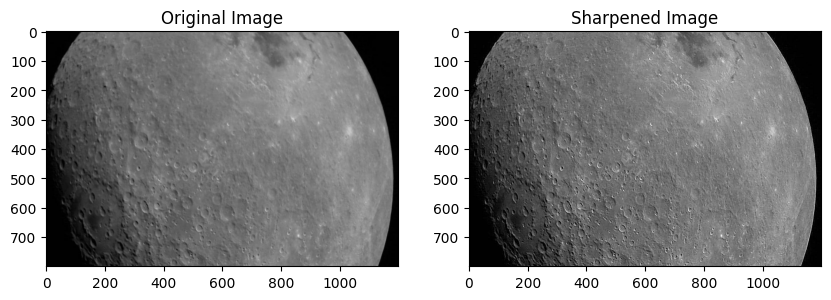

In [17]:
kernel = np.array([[-1, -1, -1],[-1,  9, -1],[-1, -1, -1]])
image_sharpened_v2 = cv2.filter2D( image_moon, -1, kernel)

# Display the original and enhanced images side by side
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv2.imread(image_path_4), cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image_sharpened_v2, cv2.COLOR_BGR2RGB))
plt.title('Sharpened Image')
plt.show()

The following kernel was also tested:

```
kernel = np.array([[-1, -1, -1],
                   [-1,  9, -1],
                   [-1, -1, -1]])
```

This kernel directly sharpens the image, and the result is shown as "Sharpened Image".  This approach amplifies the center pixel and suppresses its neighbors, achieving a sharpening effect.


---
---

# **Exercise 5**

## One combined spatial enhancement methods (e.g. arithmetic operations, gray level transformations, and/or sharpening spatial filters) to convert “image_1” to “image_2”. 

## a) Try to guess the processing steps she adopted. [Note the dynamic range and brightness of the enhanced image, and the noise introduced.]  

In [18]:
img5_1 = cv2.imread("image_1.jpg")
img5_2 = cv2.imread("image_2.jpg")
print(img5_1.shape)
print(img5_2.shape)

(641, 800, 3)
(641, 800, 3)


These are again grayscale images so we convert them to a single channel intensity represenation with `cv2.cvtColor(img5_1, cv2.COLOR_BGR2GRAY)`:

(641, 800)
(641, 800)


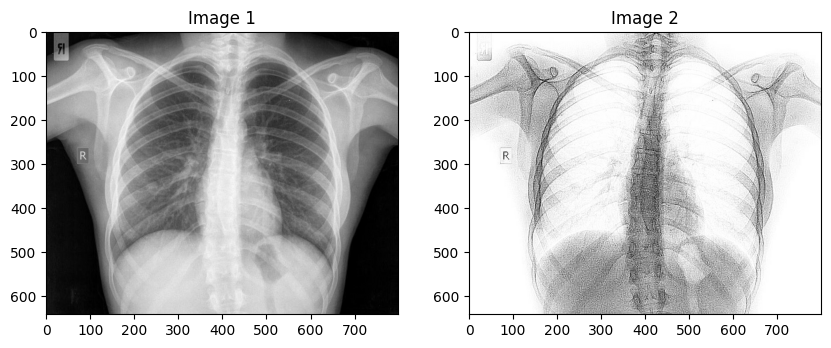

In [19]:
if len(img5_1.shape) == 3:
    img5_1 = cv2.cvtColor(img5_1, cv2.COLOR_BGR2GRAY)

if len(img5_2.shape) == 3:
    img5_2 = cv2.cvtColor(img5_2, cv2.COLOR_BGR2GRAY)

print(img5_1.shape)
print(img5_2.shape)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img5_1, cmap='gray')
plt.title('Image 1')
plt.subplot(1, 2, 2)
plt.imshow(img5_2, cmap='gray')
plt.title('Image 2')
plt.show()

We then plot their respective histograms to check their dynamic range. 

/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/1221381143.py:11: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img5_1.flatten(),256,[0,256], color = 'r')


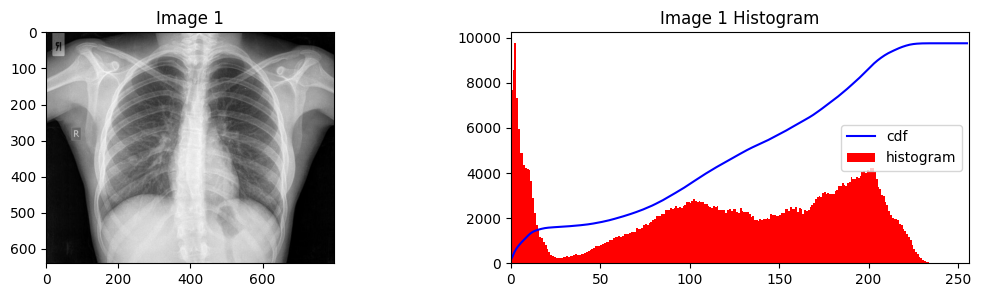

/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/1221381143.py:26: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img5_2.flatten(),256,[0,256], color = 'r')


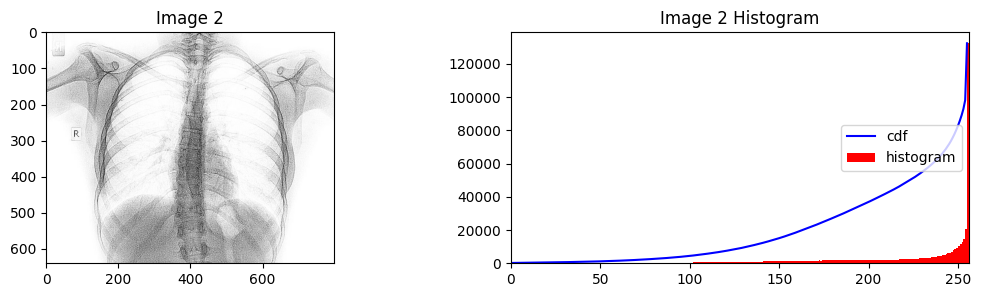

In [20]:
hist, bins = np.histogram(img5_1.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()

fig, axes = plt.subplots(1, 2, figsize=(13,3))

plt.subplot(121), plt.imshow(img5_1, cmap='gray')
plt.title('Image 1')
plt.subplot(122)
plt.plot(cdf_normalized, color = 'b')
plt.hist(img5_1.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'center right')
plt.title('Image 1 Histogram')
plt.show()

# Image 2
hist, bins = np.histogram(img5_2.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()
fig, axes = plt.subplots(1, 2, figsize=(13,3))
plt.subplot(121), plt.imshow(img5_2, cmap='gray')
plt.title('Image 2')
plt.subplot(122)
plt.plot(cdf_normalized, color = 'b')
plt.hist(img5_2.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'center right')
plt.title('Image 2 Histogram')
plt.show()

`Comment:` The target image (image_2) has a range extremely shifted to the right (towards very high intensity pixels) while the original image is balanced.

We define a function to plot the 2 histograms in one plot in order to compare them and exploring our changes and if we are proceeding towards the right road.

/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:20: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image1.flatten(), 256, [0, 256], color='lightblue', alpha=0.5, label=f'{title1} Histogram')
/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:22: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image2.flatten(), 256, [0, 256], color='lightgreen', alpha=0.5, label=f'{title2} Histogram')


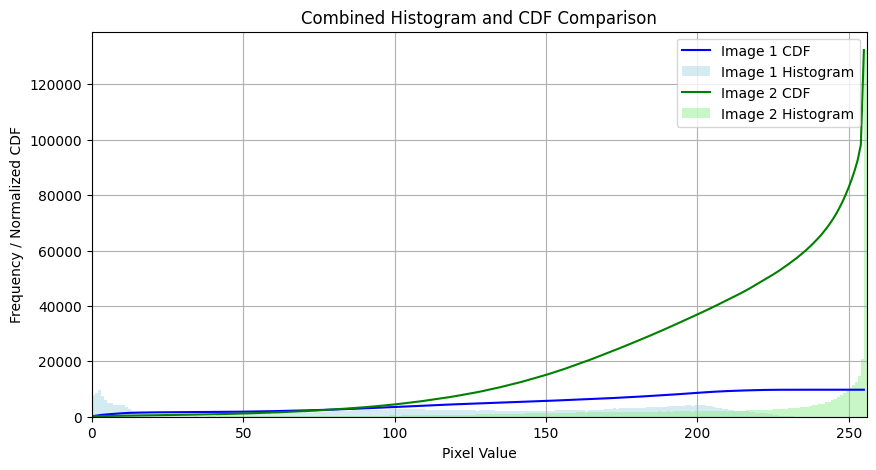

In [21]:
def plot_combined_histogram(image1, image2, title1, title2):
    """Plots and compares the histograms and cumulative distribution functions (CDFs) of two images.

    Args:
        image1 (numpy.ndarray): The first input image (grayscale).
        image2 (numpy.ndarray): The second input image (grayscale).
        title1 (str): Title for the histogram and CDF of the first image.
        title2 (str): Title for the histogram and CDF of the second image.
    """
    hist1, bins1 = np.histogram(image1.flatten(), 256, [0, 256])
    cdf1 = hist1.cumsum()
    cdf_normalized1 = cdf1 * hist1.max() / cdf1.max()

    hist2, bins2 = np.histogram(image2.flatten(), 256, [0, 256])
    cdf2 = hist2.cumsum()
    cdf_normalized2 = cdf2 * hist2.max() / cdf2.max()

    plt.figure(figsize=(10, 5))
    plt.plot(cdf_normalized1, color='blue', label=f'{title1} CDF')
    plt.hist(image1.flatten(), 256, [0, 256], color='lightblue', alpha=0.5, label=f'{title1} Histogram')
    plt.plot(cdf_normalized2, color='green', label=f'{title2} CDF')
    plt.hist(image2.flatten(), 256, [0, 256], color='lightgreen', alpha=0.5, label=f'{title2} Histogram')
    plt.xlim([0, 256])
    plt.title('Combined Histogram and CDF Comparison')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency / Normalized CDF')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

# Assuming img5_1 and img5_2 are already loaded and grayscale
plot_combined_histogram(img5_1, img5_2, title1='Image 1', title2='Image 2')

 The transformation has successfully achieved the goal of making Image 1 look very similar to Image 2.

### Step 1: Gamma correction (default gamma=0.8) - Imporve brightness

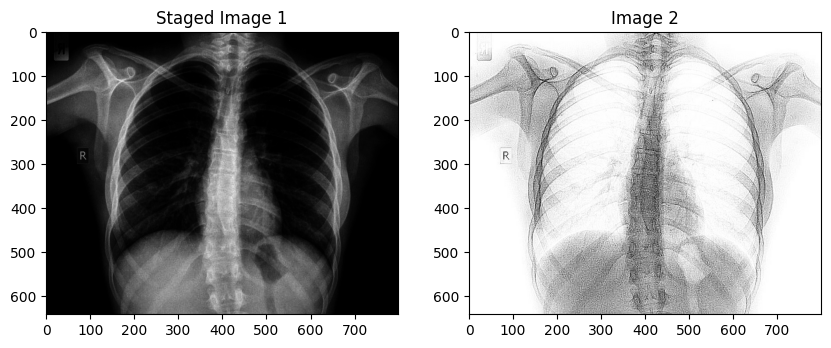

In [22]:
stage_1 = adjust_gamma(img5_1, 0.25) 

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(stage_1, cmap='gray')
plt.title('Staged Image 1')
plt.subplot(1, 2, 2)
plt.imshow(img5_2, cmap='gray')
plt.title('Image 2')
plt.show()

/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:20: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image1.flatten(), 256, [0, 256], color='lightblue', alpha=0.5, label=f'{title1} Histogram')
/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:22: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image2.flatten(), 256, [0, 256], color='lightgreen', alpha=0.5, label=f'{title2} Histogram')


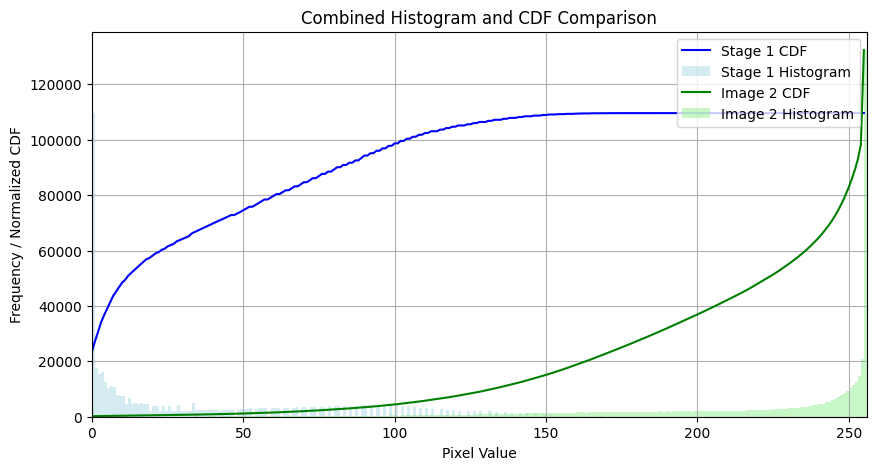

In [23]:
# Assuming img5_1 and img5_2 are already loaded and grayscale
plot_combined_histogram(stage_1, img5_2, title1='Stage 1', title2='Image 2')

Now we have achieved an opposite dynamic range and it is possible to obtain the **negative representation** of the original image by subtracting the original image from an image with a uniform intensity value of 255.

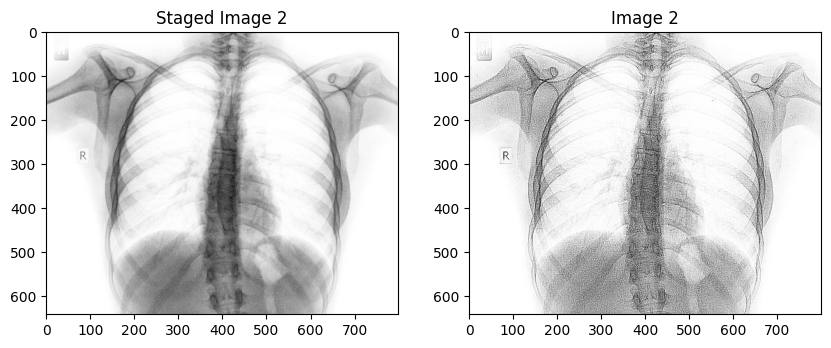

In [24]:
stage_2 = 255 - stage_1

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(stage_2, cmap='gray')
plt.title('Staged Image 2')
plt.subplot(1, 2, 2)
plt.imshow(img5_2, cmap='gray')
plt.title('Image 2')
plt.show()

/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:20: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image1.flatten(), 256, [0, 256], color='lightblue', alpha=0.5, label=f'{title1} Histogram')
/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:22: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image2.flatten(), 256, [0, 256], color='lightgreen', alpha=0.5, label=f'{title2} Histogram')


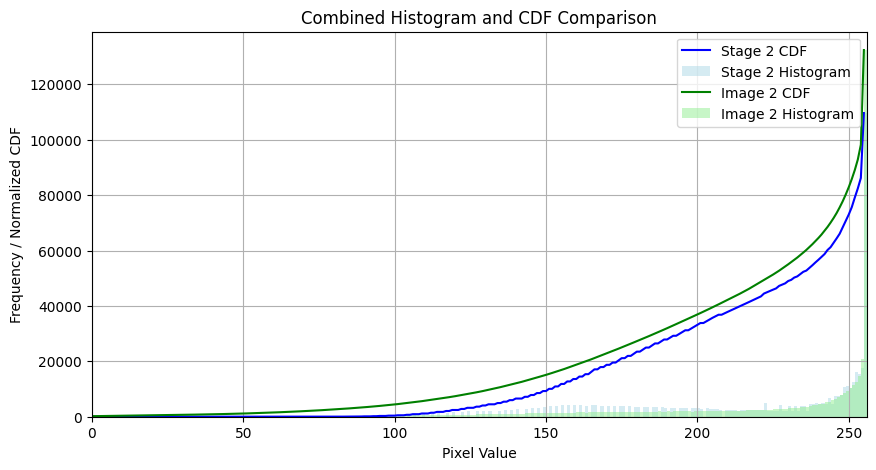

In [25]:
plot_combined_histogram(stage_2, img5_2, title1='Stage 2', title2='Image 2')

As you can see from the histograms above, low frequency values are weakened and the image has a noisy effect. Remembering our results from method b) in Exercise 4, we utilzie the same high pass filter.

$$
\text{kernel} = \begin{bmatrix}
-1 & -1 & -1 \\
-1 &  9 & -1 \\
-1 & -1 & -1
\end{bmatrix}.
$$

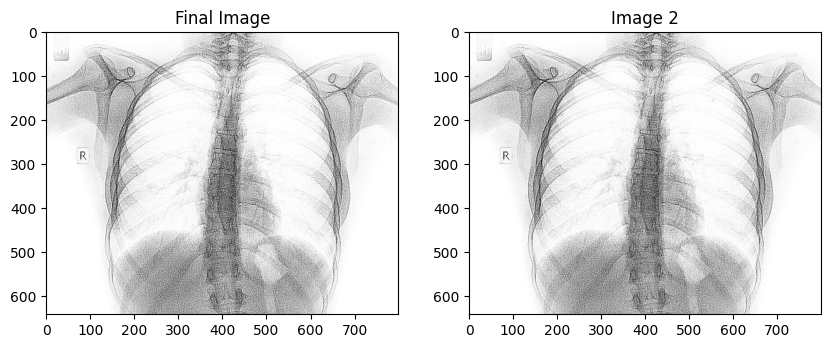

In [26]:
kernel = np.array([[-1, -1, -1],[-1,  9, -1],[-1, -1, -1]])

final_stage = cv2.filter2D(stage_2, -1, kernel)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(final_stage, cmap='gray')
plt.title('Final Image')
plt.subplot(1, 2, 2)
plt.imshow(img5_2, cmap='gray')
plt.title('Image 2')
plt.show()

/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:20: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image1.flatten(), 256, [0, 256], color='lightblue', alpha=0.5, label=f'{title1} Histogram')
/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:22: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image2.flatten(), 256, [0, 256], color='lightgreen', alpha=0.5, label=f'{title2} Histogram')


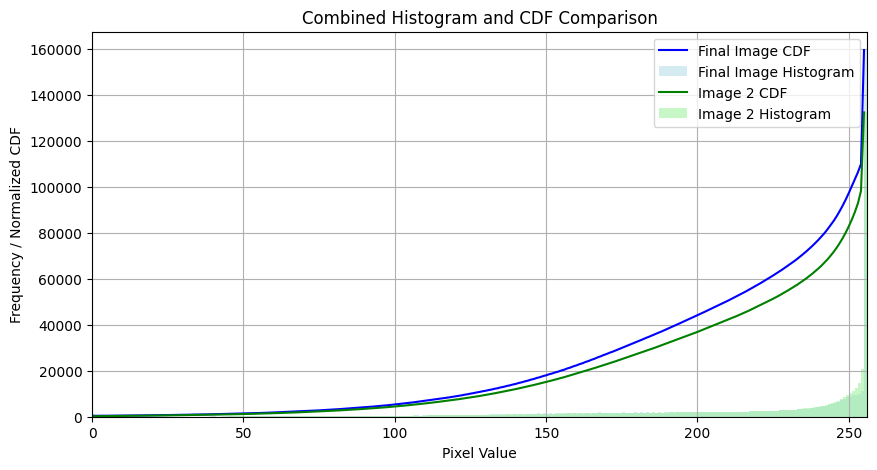

In [27]:
plot_combined_histogram(final_stage, img5_2, title1='Final Image', title2='Image 2')

We managed to achieve a really close representation of the targeted image.

## b) Propose a pipeline of processes with the aim of approximating “image_1” starting from “image_2”. 

This task is the opposite transformation of question (a).

We begin by applying GaussianBlur to undo the sharpning and enrich low frequency details.

In this case we use 7x7 kenrel matrix. This means that each pixel in the image will be replaced with the average of its surrounding 7x7 pixels.

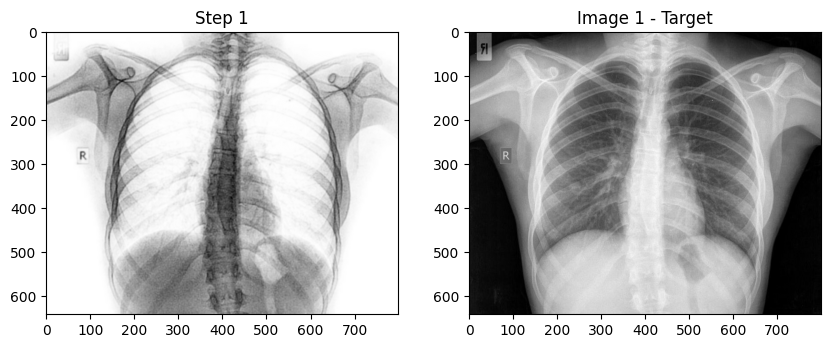

In [28]:
step_1 = cv2.GaussianBlur(img5_2, (7, 7), 0)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(step_1, cmap='gray')
plt.title('Step 1')
plt.subplot(1, 2, 2)
plt.imshow(img5_1, cmap='gray')
plt.title('Image 1 - Target')
plt.show()

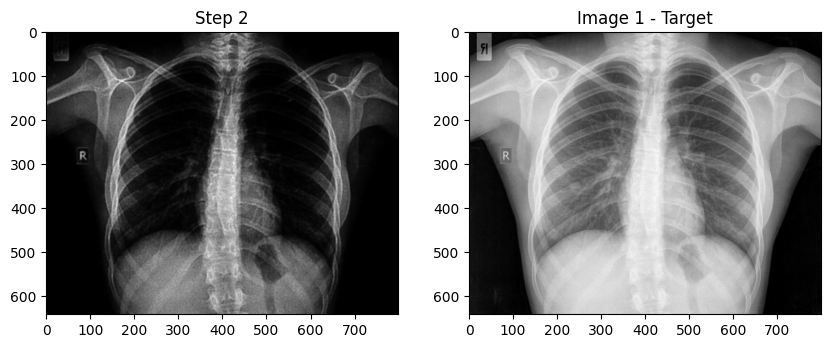

In [29]:
step_2 = cv2.bitwise_not(step_1)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(step_2, cmap='gray')
plt.title('Step 2')
plt.subplot(1, 2, 2)
plt.imshow(img5_1, cmap='gray')
plt.title('Image 1 - Target')
plt.show()

/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:20: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image1.flatten(), 256, [0, 256], color='lightblue', alpha=0.5, label=f'{title1} Histogram')
/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:22: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image2.flatten(), 256, [0, 256], color='lightgreen', alpha=0.5, label=f'{title2} Histogram')


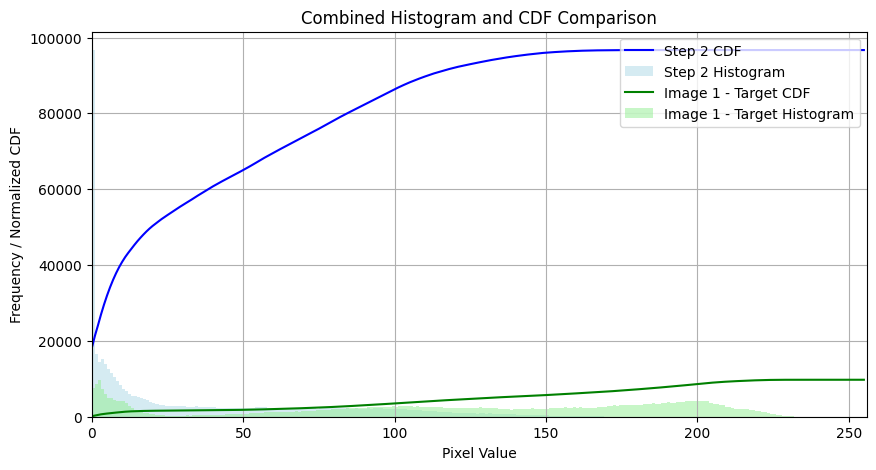

In [30]:
plot_combined_histogram(step_2, img5_1, title1='Step 2', title2='Image 1 - Target')

The dynamic range of our image is shifted to very low values, thus we apply histogam equalization.

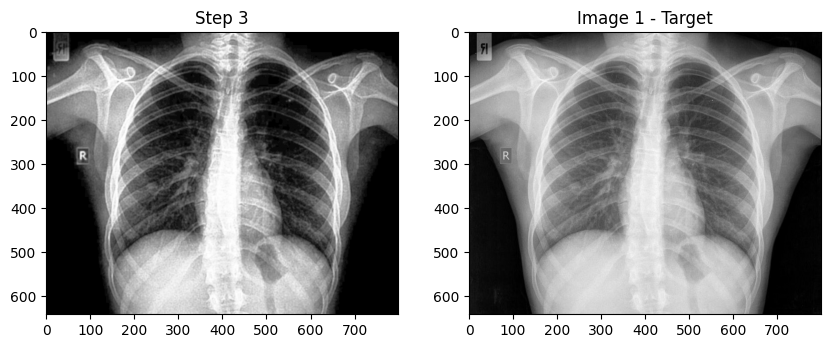

In [31]:
step_3 = cv2.equalizeHist(step_2)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(step_3, cmap='gray')
plt.title('Step 3')
plt.subplot(1, 2, 2)
plt.imshow(img5_1, cmap='gray')
plt.title('Image 1 - Target')
plt.show()

/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:20: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image1.flatten(), 256, [0, 256], color='lightblue', alpha=0.5, label=f'{title1} Histogram')
/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_2956/2772020553.py:22: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image2.flatten(), 256, [0, 256], color='lightgreen', alpha=0.5, label=f'{title2} Histogram')


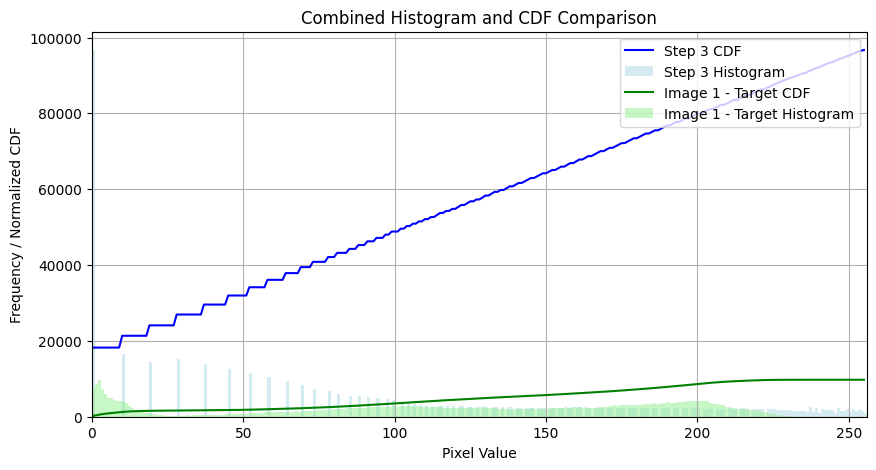

In [32]:
plot_combined_histogram(step_3, img5_1, title1='Step 3', title2='Image 1 - Target') # function from 5a

Finally, we have to sharpen the image.

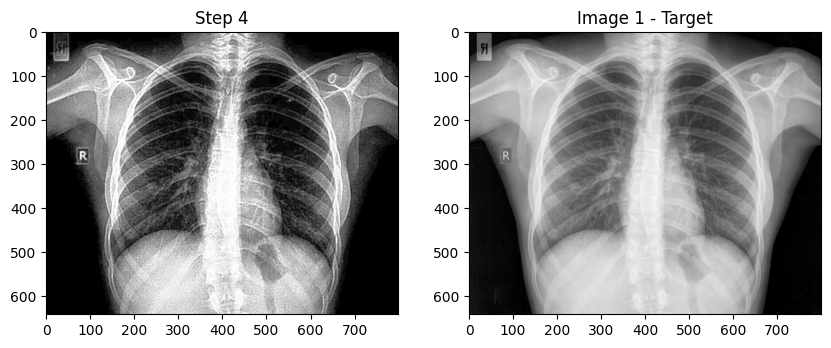

In [33]:
kernel  = unsharp(0.1)
step_4 = cv2.filter2D(step_3, -1, kernel)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(step_4, cmap='gray')
plt.title('Step 4')
plt.subplot(1, 2, 2)
plt.imshow(img5_1, cmap='gray')
plt.title('Image 1 - Target')
plt.show()

 "Step 4" is an enhanced version of the target image and still needs further adjustments to match the clarity and contrast of the "Image 1 - Target". It appears that the opposite task was more difficult than the first one.

---
---

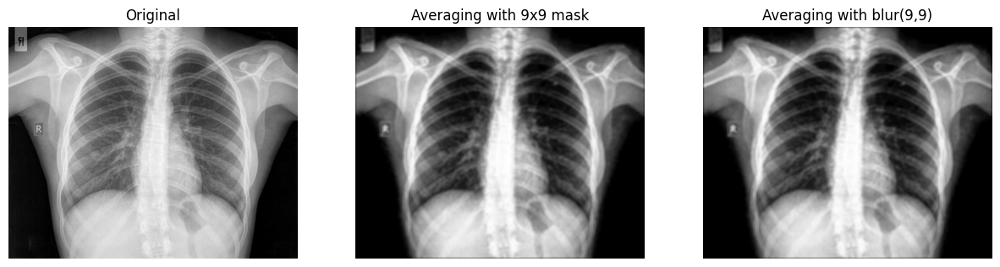

In [34]:
fig, axes = plt.subplots(1, 3, figsize=(15,7))
plt.subplot(131), plt.imshow(img5_1, cmap='gray'), plt.title('Original'), 
plt.axis('off')

kernel = np.ones((9,9),np.float32)/81
dst1 = cv2.filter2D(step_4, -1, kernel, borderType=cv2.BORDER_CONSTANT)
plt.subplot(132), plt.imshow(dst1, cmap='gray'), plt.title('Averaging with 9x9 mask'), 
plt.axis('off')

dst2 = ndi.convolve(step_4, kernel, mode='constant')
plt.subplot(133), plt.imshow(dst2, cmap='gray'), plt.title('Averaging with blur(9,9)'), 
plt.axis('off')

plt.show()

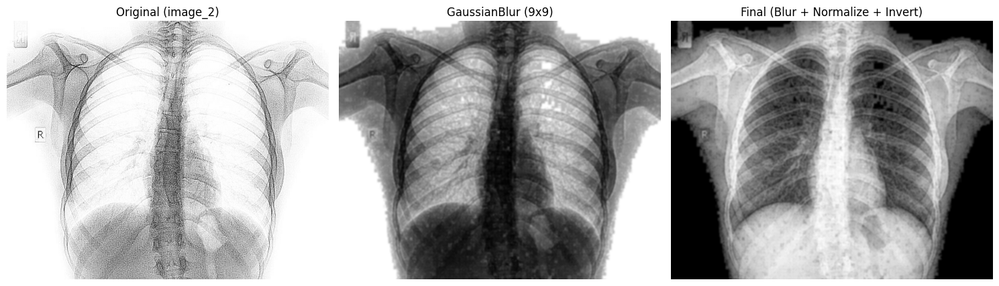

In [35]:
# Load the high-contrast X-ray (image_2)
img = cv2.imread('image_2.jpg', cv2.IMREAD_GRAYSCALE)

# Step 1: Reduce contrast a bit (Histogram Equalization — optional)
img_eq = cv2.equalizeHist(img)

# Step 2: Apply heavy blur to suppress edge enhancement
img_blur = cv2.GaussianBlur(img_eq, (9, 9), sigmaX=2)

# Step 3: Normalize brightness levels to match typical X-ray tone
img_norm = cv2.normalize(img_blur, None, alpha=50, beta=200, norm_type=cv2.NORM_MINMAX)

# # Step 3: Invert image (if image_2 is a negative or has inverted contrast)
image_inverted = cv2.bitwise_not(img_norm)

# Display results for comparison
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original (image_2)')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_blur, cmap='gray')
plt.title('GaussianBlur (9x9)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(image_inverted, cmap='gray')
plt.title('Final (Blur + Normalize + Invert)')
plt.axis('off')

plt.tight_layout()
plt.show()

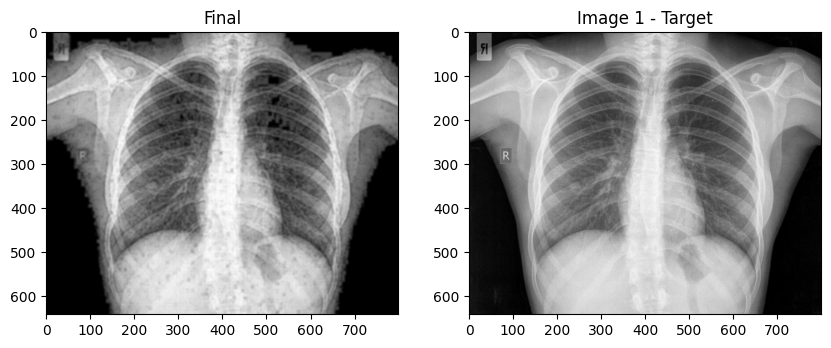

In [36]:
# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_inverted, cmap='gray')
plt.title('Final')
plt.subplot(1, 2, 2)
plt.imshow(img5_1, cmap='gray')
plt.title('Image 1 - Target')
plt.show()

---
---

# **Exercise 6**

## a) Find the main edges of image11.jpg.  

First, load the image11:

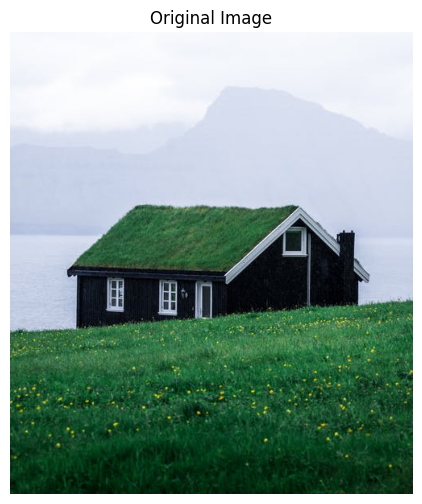

In [217]:
# Load the image
image_path_6 = "image11.jpg"
image_11 = cv2.imread(image_path_6)

# Display the original image
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(image_11, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB for matplotlib
plt.title("Original Image")
plt.axis('off')
plt.show()

Before applying any edge detection algorithm, it is recommended to apply a blurring filter to the image in order to reduce noise. One commonly used filter for blurring is the Gaussian blur,which we utilized in exercise 5.

In [218]:
image_11 = cv2.cvtColor(image_11, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(image_11, (7, 7), 3)

The Sobel operators is designed to highlight areas of rapid change (gradient) in the intensity of an image and can be used as an edge detection method.

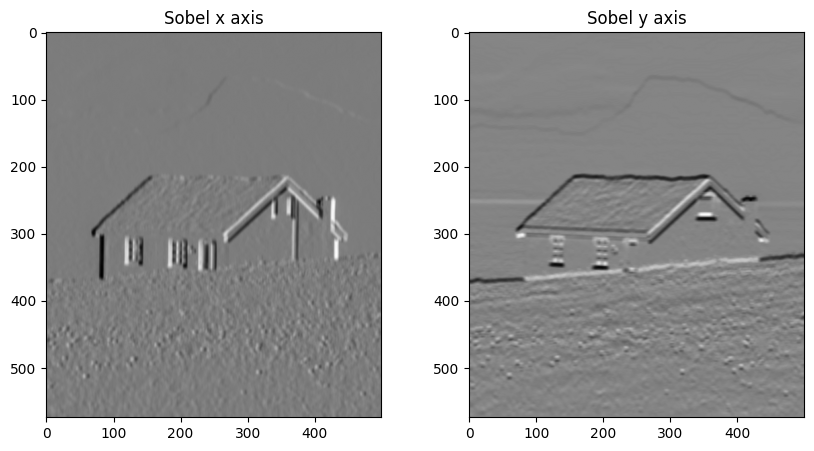

In [219]:
grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(grad_x, cmap='gray')
plt.title('Sobel x axis')
plt.subplot(1, 2, 2)
plt.imshow(grad_y, cmap='gray')
plt.title('Sobel y axis')
plt.show()

However, we can enhance this method by utilizing a more advanced approach, the Canny algorithm.

In addition to blurring and computing gradients in the x and y directions, the Canny algorithm involves the following additional stages:

2. Find the edge gradient magnitude and direction for each pixel
3. Non-maximum Suppression
4. Hysteresis Thresholding

2. We can then be used to determine the edge gradient and direction for each pixel by the following process:

$$\text{Edge Gradient}(G) = \sqrt{G_{x}^{2} + G_{y}^{2}} \qquad \qquad \text{Angle}(\theta) = \tan^{-1} \left(\frac{G_{y}}{G_{x}} \right)$$

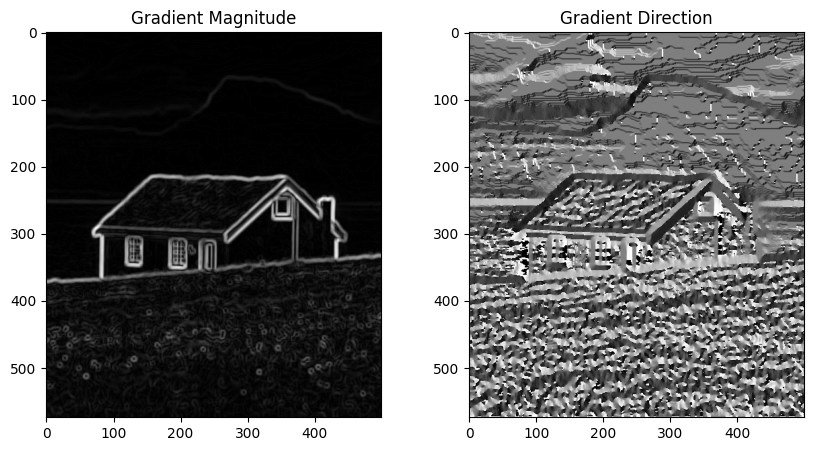

In [220]:
grad_mag = np.sqrt(grad_x ** 2 + grad_y ** 2)
grad_dir = np.arctan2(grad_y, grad_x)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(grad_mag, cmap='gray')
plt.title('Gradient Magnitude')
plt.subplot(1, 2, 2)
plt.imshow(grad_dir, cmap='gray')
plt.title('Gradient Direction')
plt.show()

3. Non-maximum Suppression: The process involves scanning the entire image and examining each pixel to determine whether it is a local maximum in the direction of the gradient within its neighborhood. If it is its value is retained, if not it is set to 0.

4. Hysteresis Thresholding: At this final stage, the goal is to distinguish true edges from non-edges. Two threshold values, minVal and maxVal are utilzied . Edges with an intensity gradient greater than maxVal are deemed true edges, while those with values below minVal are non-edges. Any edges that fall within these thresholds are assessed based on their connectivity to true edge pixels. If they are connected to such pixels, they are identified as part of an edge. Otherwise, they are discarded as well.

Having explained how the Canny algorithms works we can utilize it via `cv2.Canny` on the blurred grayscale image.

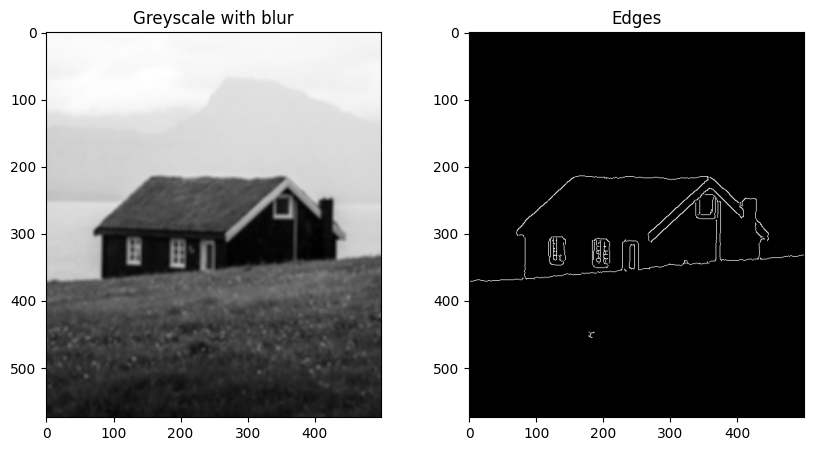

In [221]:
edge = cv2.Canny(gray,50,150,apertureSize = 3)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title('Greyscale with blur')
plt.subplot(1, 2, 2)
plt.imshow(edge, cmap='gray')
plt.title('Edges')
plt.show()

## b)

- First parameter, Input image should be a `binary image`, so we will use the canny edge detection method we used in (a), before applying hough transform. 
- Second and third parameters are $\rho$ and $\theta$ accuracies respectively. 
- Fourth argument is the threshold, which means minimum vote it should get for it to be considered as a line. Remember, number of votes depend upon number of points on the line. So it represents the minimum length of line that should be detected.

In [222]:
def find_lines(edges,threshold,deegre_min,degree_max):
    """
    Finds lines in an image using the Hough Transform, filtering by angle.

    Args:
        edges (numpy.ndarray): The input edge image (output of an edge detection algorithm).
        threshold (int): The minimum number of votes a line must receive to be considered.
        deegre_min (float): The minimum angle (in degrees) of the lines to be kept.
        degree_max (float): The maximum angle (in degrees) of the lines to be kept.

    Returns:
        tuple: A tuple containing two lists:
            - keep_angles (list): A list of the angles (in degrees) of the kept lines.
            - keep_lines (list): A list of the (rho, theta) parameters of the kept lines.
    """
    lines = cv2.HoughLines(edges, 1, np.pi/180, threshold)

    keep_angles = []
    keep_lines = []
    for line in lines:
        rho, theta = line[0]
        angle = math.degrees(theta)
        if angle< 90:
          angle = 90 - angle
        else:
          angle = 270 - angle
        if angle >= deegre_min and angle <= degree_max:
            keep_angles.append(angle)
            keep_lines.append(line)

    return keep_angles, keep_lines

In [223]:
roof_angles, roof_lines = find_lines(edge,81,40,140)
print(f"{len(roof_lines)} lines found")

6 lines found


/var/folders/2_/7r3mtx994v502lqlrst6pylw0000gn/T/ipykernel_3587/4044888552.py:23: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


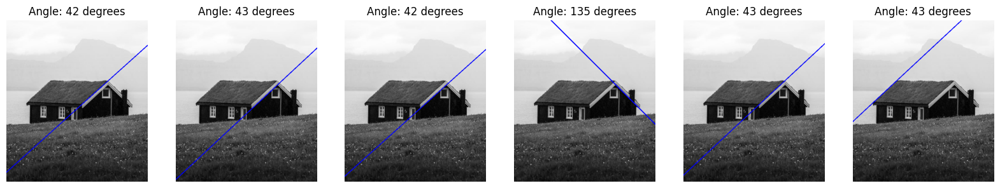

In [224]:
def plot_lines(angles,lines,img):
  counter = 0
  fig, axs = plt.subplots(1,len(angles),figsize = (20,10))
  for line in lines:
      tmp_img = img.copy()
      tmp_img_rgb = cv2.cvtColor(tmp_img, cv2.COLOR_BGR2RGB)

      rho, theta = line[0]
      a = np.cos(theta)
      b = np.sin(theta)
      x0 = a*rho
      y0 = b*rho
      x1 = int(x0 + 1000*(-b))
      y1 = int(y0 + 1000*(a))
      x2 = int(x0 - 1000*(-b))
      y2 = int(y0 - 1000*(a))

      cv2.line(tmp_img_rgb,(x1,y1),(x2,y2),(0,0,255),2)
      axs[counter].imshow(tmp_img_rgb)
      axs[counter].set_title(f"Angle: {round(angles[counter])} degrees")
      axs[counter].axis('off') 
      counter += 1    
  fig.show()

plot_lines(roof_angles,roof_lines,image_11)

## c) Find the corners of the image11.jpg.

### Harris Corner Detection

The Harris method finds corners by looking at how much the image intensity changes when we shift a small window. It uses a mathematical formula involving image gradients to calculate a "cornerness" score for each pixel.

The input must be `grayscale` and `float32` type.

`blockSize`is the **size of the neighborhood window** considered for corner detection. For each pixel, a `blockSize x blockSize` window around it is analyzed to calculate the corner response. A larger block size considers a larger area, potentially making the detection less sensitive to fine details but more robust to noise. In this case, we set it to `3`.

`ksize` is the **size of the Sobel kernel** used for calculating the image derivatives (gradients) in the x and y directions. These derivatives are crucial for building the structure tensor. A larger kernel size can make the derivative calculation smoother. Here, it's set to `7`.

`k` is the **Harris detector free parameter**. It's a constant in the corner response function that determines the sensitivity of the algorithm to corners. In this case, it's set to `0.04`.

The function `cv2.cornerHarris()` returns an array (often the same size as the input grayscale image) where each element represents the **corner response value** for the corresponding pixel. Higher positive values indicate a higher probability of that pixel being a corner.

- **Big score:** Likely a corner (intensity changes a lot in all directions).
- **Medium score (negative):** Likely an edge (intensity changes a lot in one direction).
- **Small score:** Likely a flat region (little intensity change).

In [225]:
corners = cv2.cornerHarris(gray, 3, 7, 0.04)

In [226]:
corner_mask = corners > 0.05 * corners.max()
corner_mask = np.where(corner_mask, 255, 0)
corner_mask = np.uint8(corner_mask)

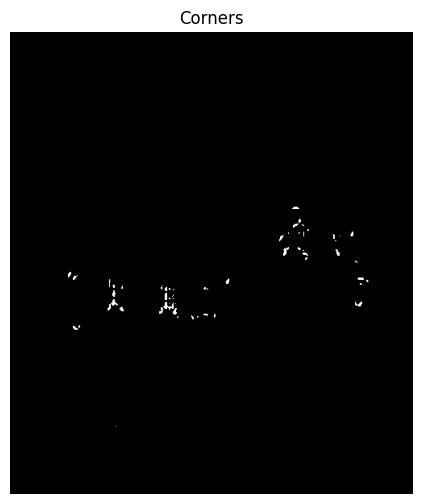

In [227]:
# Display result
plt.figure(figsize=(8, 6))
plt.imshow(corner_mask, cmap='gray')
plt.title('Corners')
plt.axis('off')
plt.show()

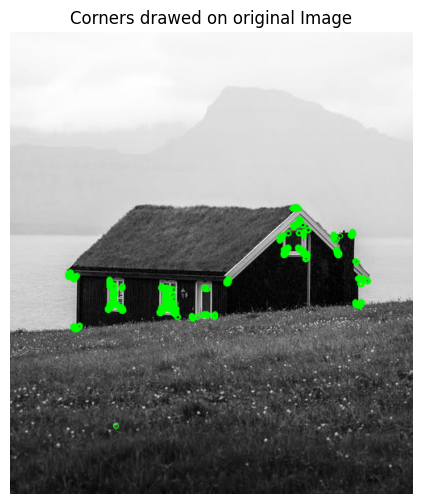

In [228]:
tmp_img = image_11.copy()
keypoints = []
for y in range(corner_mask.shape[0]):
    for x in range(corner_mask.shape[1]):
        if corner_mask[y][x] == 255:
            keypoints.append(cv2.KeyPoint(x, y, 1))

# Draw the keypoints on the image
img_with_keypoints = cv2.drawKeypoints(tmp_img, keypoints, None, color=(0, 255, 0))

# Display the image with keypoints
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Corners drawed on original Image')
plt.axis('off')
plt.show()

## d) Based on the detected corners, locate the windows.   

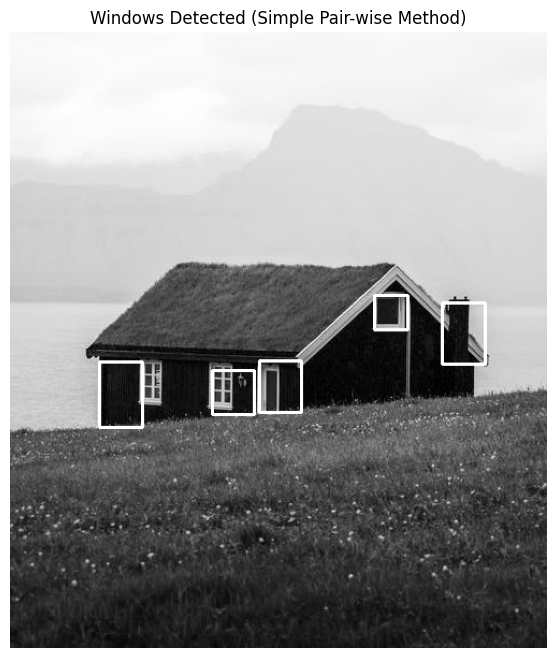

In [ ]:
# Extract the coordinates of the corners
corner_coords = np.column_stack(np.where(corner_mask > 0.1))

# Draw bounding boxes around each corner point
output_image = image_11.copy()
for coord in corner_coords:
    x, y = coord
    cv2.rectangle(output_image, (y - 5, x - 5), (y + 5, x + 5), (255, 0, 0), 1)

# Parameters for Window Detection
min_width = 30    # Minimum window width
max_width = 40    # Maximum window width
min_height = 30   # Minimum window height
max_height = 80   # Maximum window height

min_aspect_ratio = 0.65 # Minimum aspect ratio (width / height)
max_aspect_ratio = 1.05 # Maximum aspect ratio (width / height)

# Filter corners based on proximity to form potential windows
window_candidates = []
for i in range(len(corner_coords)):
    for j in range(i + 1, len(corner_coords)):
        y1, x1 = corner_coords[i] # Remember corner_coords is (row, col) -> (y, x)
        y2, x2 = corner_coords[j]

        # Ensure x1 is smaller than x2, and y1 is smaller than y2 for consistent bounding box
        x_min = min(x1, x2)
        x_max = max(x1, x2)
        y_min = min(y1, y2)
        y_max = max(y1, y2)

        width = x_max - x_min
        height = y_max - y_min

        # Avoid zero width/height or negative if points are too close
        if width <= 0 or height <= 0:
            continue

        aspect_ratio = float(width) / height

        # Check if dimensions and aspect ratio are within plausible window size
        if (min_width <= width <= max_width and
            min_height <= height <= max_height and
            min_aspect_ratio <= aspect_ratio <= max_aspect_ratio):
            window_candidates.append((x_min, y_min, x_max, y_max)) # Store as (xmin, ymin, xmax, ymax)

# Eliminate duplicate or overlapping windows (Non-Maximum Suppression - NMS)
unique_windows = []
# Sort by area (larger windows first) to give preference in NMS
window_candidates.sort(key=lambda bbox: (bbox[2]-bbox[0])*(bbox[3]-bbox[1]), reverse=True)

iou_threshold = 0.3 # Intersection Over Union threshold for considering a window as a duplicate

for current_box in window_candidates:
    is_duplicate = False
    x1, y1, x2, y2 = current_box

    for existing_box in unique_windows:
        ex1, ey1, ex2, ey2 = existing_box

        # Calculate intersection coordinates
        inter_x1 = max(x1, ex1)
        inter_y1 = max(y1, ey1)
        inter_x2 = min(x2, ex2)
        inter_y2 = min(y2, ey2)

        # Calculate intersection area
        inter_width = max(0, inter_x2 - inter_x1)
        inter_height = max(0, inter_y2 - inter_y1)
        intersection_area = inter_width * inter_height

        # Calculate union area
        area_current = (x2 - x1) * (y2 - y1)
        area_existing = (ex2 - ex1) * (ey2 - ey1)
        union_area = float(area_current + area_existing - intersection_area)

        if union_area > 0: # Avoid division by zero
            iou = intersection_area / union_area
            if iou > iou_threshold:
                is_duplicate = True
                break
    
    if not is_duplicate:
        unique_windows.append(current_box)


# Draw bounding boxes around the detected windows
output_image = image_11.copy()
for x1, y1, x2, y2 in unique_windows:
    cv2.rectangle(
        output_image,
        (x1, y1), # Top-left corner
        (x2, y2), # Bottom-right corner
        (255, 0, 0), # Red color
        2, # Thickness
    )

# Display the result
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title("Windows Detected (Simple Pair-wise Method)")
plt.axis('off')
plt.show()


We managed to idenify very well the upper right window and in a decent way the door and the middle window. We din't manage to idenitfy the very left window (as it seems to confuse the wall with a window) and also it confuses the chimney as a window.

---
---

# **Exercise 7**

## a) Estimate the angle with respect to the horizontal axis of the billiard cue in image31.jpg. To verify your answer, rotate the input image accordingly. The result should be similar to image32.jpg.

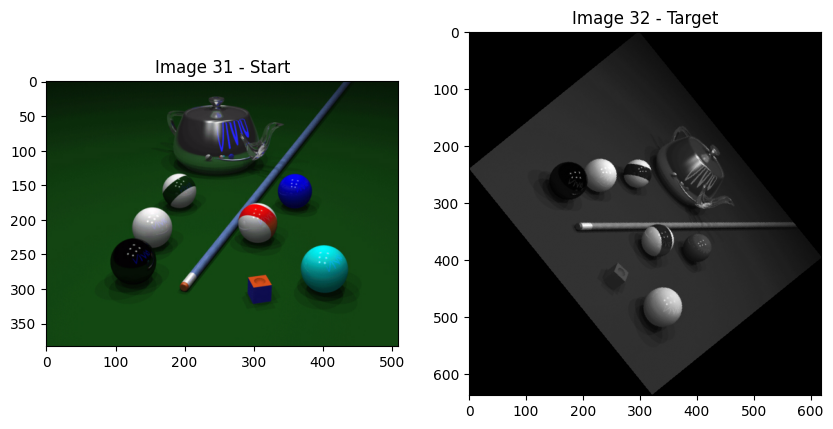

In [55]:
# Load the images
image31 = cv2.imread('image31.png')
original_image = image31.copy() # keep a copy of the original image for the final rotation

gray32 = cv2.imread('image32.png', cv2.IMREAD_GRAYSCALE)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image31, cmap='gray')
plt.title('Image 31 - Start')
plt.subplot(1, 2, 2)
plt.imshow(gray32, cmap='gray')
plt.title('Image 32 - Target')
plt.show()

To estimate the angle with respect to the horizontal axis we utilize:

1. The Canny edge detection algorithm to find the edges of the image
2. The Hough algorithm to detect straight lines.

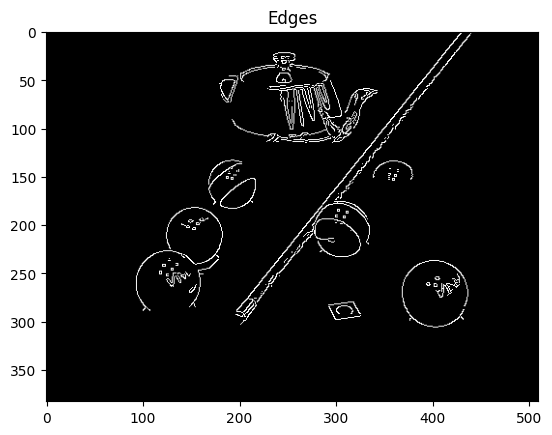

In [56]:
# Convert to grayscale
gray31 = cv2.cvtColor(image31, cv2.COLOR_BGR2GRAY)

# Apply edge detection
edge31 = cv2.Canny(gray31, 50, 150, apertureSize = 3)

# Display the edges
plt.plot(10, 5) 
plt.imshow(edge31, cmap='gray')
plt.title('Edges')
plt.show()

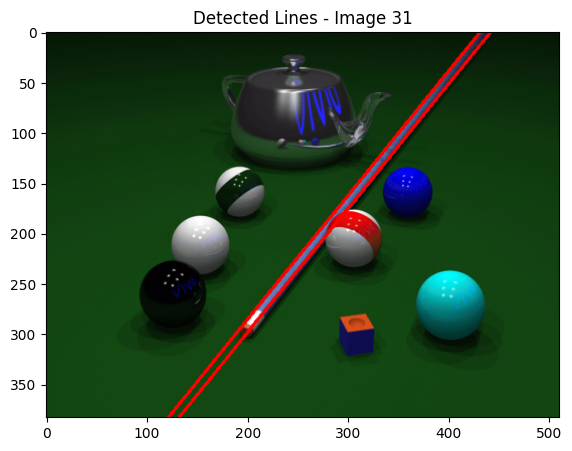

In [57]:
# Detect lines using Hough Transform
lines31 = cv2.HoughLines(edge31, 1, np.pi/180, 150)
for line in lines31:
    for rho, theta in line:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))

        cv2.line(image31, (x1,y1), (x2,y2), (255,0,0), 2)
plt.figure(figsize=(10, 5))
plt.imshow(image31, cmap='gray')
plt.title('Detected Lines - Image 31')
plt.show()

In [58]:
# find the angle of the lines
angles31 = []
for line in lines31:
    for rho, theta in line:
        angle = np.degrees(theta)
        if angle < 90:
            angle = 90 - angle
        else:
            angle = 270 - angle
        angles31.append(angle)
print(f"Estimated roof edge angles (degrees): {angles31}")

Estimated roof edge angles (degrees): [np.float32(51.0), np.float32(51.0)]


Now we are ready to rotate the image 31 accordingly.

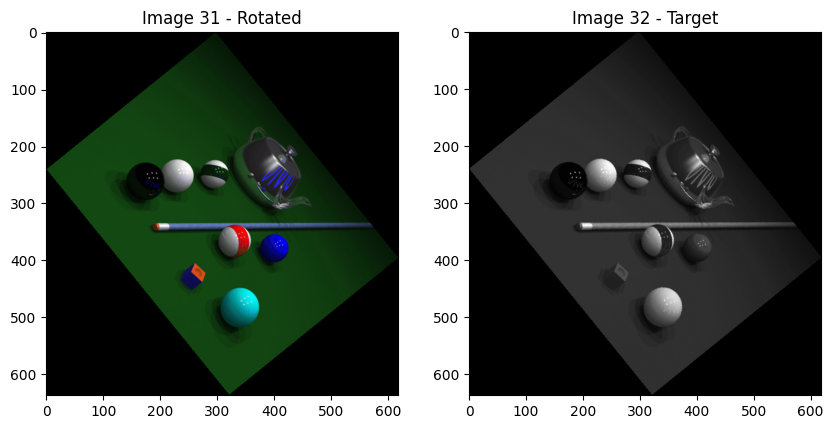

In [59]:
img_final = ndimage.rotate(original_image,-angles31[0], reshape=True)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_final, cmap='gray')
plt.title('Image 31 - Rotated')
plt.subplot(1, 2, 2)
plt.imshow(gray32, cmap='gray')
plt.title('Image 32 - Target')
plt.show()

## b) Combine image31.jpg and image32.jpg to generate an image similar to image 33.jpg.

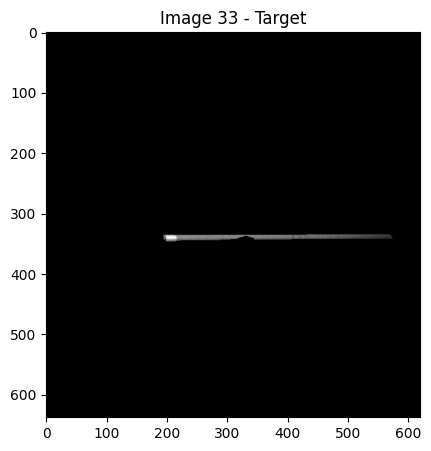

In [60]:
image33 = cv2.imread('image33.png')

# Display the image
plt.figure(figsize=(10, 5))
plt.imshow(image33, cmap='gray')
plt.title('Image 33 - Target')
plt.show()

Given this target, the goal is to:

- Isolate the billiard cue from image32.png. Since image32.png seems to be a grayscale representation where the cue is prominent, we can probably use a threshold to create a mask for it.
- Overlay this isolated cue onto image31.jpg.

---

Isolating the Billiard Cue using `HSV Color Space`

Here, we demonstrates how to isolate the billiard cue in an image by leveraging the Hue and Saturation channels of the HSV color space. The rationale is that the color of the billiard cue will likely fall within a specific range of Hue and Saturation values, allowing us to differentiate it from other objects in the scene.

The Value channel in HSV represents the brightness or intensity of the color and is essentially the grayscale representation of the image.

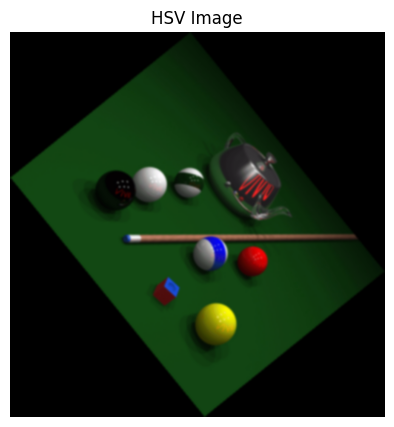

In [61]:
# Apply Gaussian blur to reduce noise
blur = cv2.GaussianBlur(img_final, (7, 7), 0)

# Convert the blurred image directly to HSV color space
img_hsv = cv2.cvtColor(blur, cv2.COLOR_BGR2HSV)

# Display the HSV image (converted back to RGB for matplotlib)
plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB))
plt.title('HSV Image')
plt.axis('off')
plt.show()

The code prints the shapes of the resulting hue, saturation, and value arrays. They should have the same height and width as the original img_final (and img_hsv).

In [62]:
# Split the HSV image into its individual channels
hue, saturation, value = cv2.split(img_hsv)

print("HSV channels have been split into 'hue', 'saturation', and 'value' variables.")
print(f"Shape of Hue channel: {hue.shape}")
print(f"Shape of Saturation channel: {saturation.shape}")
print(f"Shape of Value channel: {value.shape}")

HSV channels have been split into 'hue', 'saturation', and 'value' variables.
Shape of Hue channel: (637, 619)
Shape of Saturation channel: (637, 619)
Shape of Value channel: (637, 619)


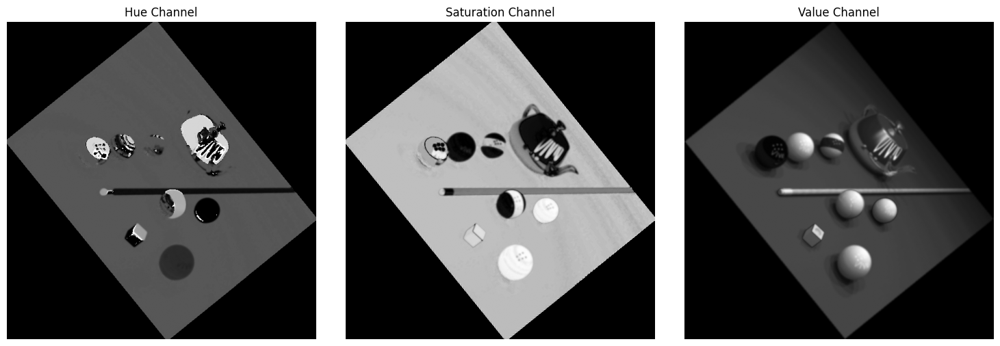

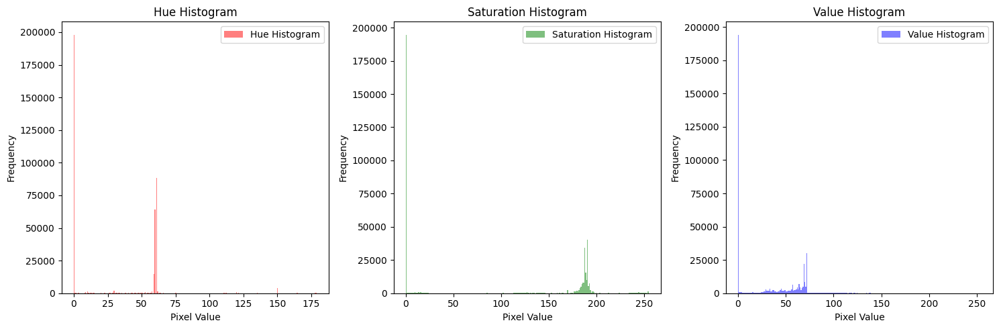

In [63]:
# Show channel images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(hue, cmap='gray')
plt.title('Hue Channel')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(saturation, cmap='gray')
plt.title('Saturation Channel')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(value, cmap='gray')
plt.title('Value Channel')
plt.axis('off')
plt.tight_layout()
plt.show()

# Plot the histograms and the CDF of the H(ue), S(aturation), and V(alue) channels
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(hue.flatten(), bins=256, color='r', alpha=0.5, label='Hue Histogram')
plt.title('Hue Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()
plt.subplot(1, 3, 2)
plt.hist(saturation.flatten(), bins=256, color='g', alpha=0.5, label='Saturation Histogram')
plt.title('Saturation Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()
plt.subplot(1, 3, 3)
plt.hist(value.flatten(), bins=256, color='b', alpha=0.5, label='Value Histogram')
plt.title('Value Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()
plt.show()

`Creating Masks Based on Hue and Saturation Channels`

By examining the histograms and the individual Hue and Saturation channels, we can identify the pixel value ranges that correspond to the billiard cue.

In the **Hue channel**, the billiard cue appears to have pixel values roughly between 8 and 20. We can create a binary mask where pixels within this range are set to 0 (black) and pixels outside this range are set to 255 (white).

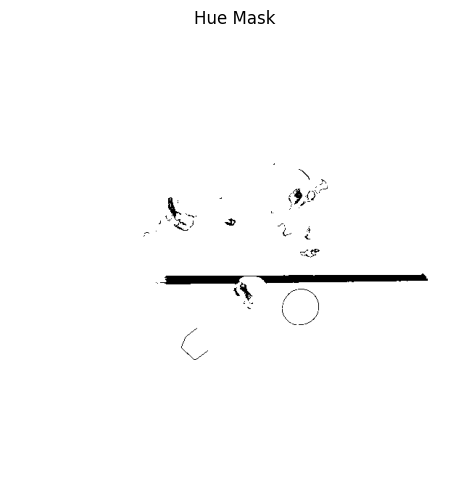

In [64]:
# Create a mask for the Hue channel
hue_mask = ((hue >= 8) & (hue <= 20))
hue_tmp = np.where(hue_mask, 0, 255)

# Display the mask
plt.figure(figsize=(8, 6))
plt.imshow(hue_tmp, cmap='gray')
plt.title('Hue Mask')
plt.axis('off')
plt.show()

Similarly, in the **Saturation channel**, the billiard cue seems to have values approximately between 110 and 130. We create another binary mask based on this range.

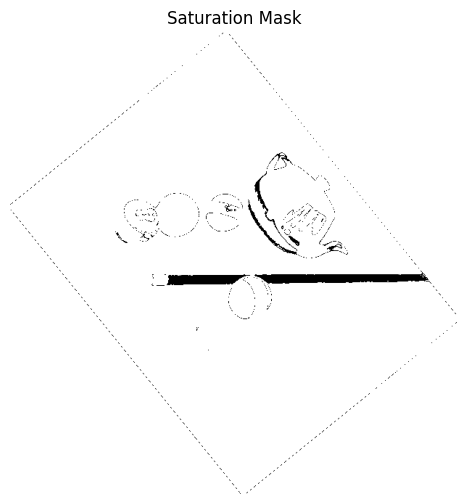

In [65]:
# Create a mask for the Saturation channel
saturation_mask = (saturation > 110) & (saturation < 130)
saturation_tmp = np.where(saturation_mask, 0, 255)

# Display the mask
plt.figure(figsize=(8, 6))
plt.imshow(saturation_tmp, cmap='gray')
plt.title('Saturation Mask')
plt.axis('off')
plt.show()

Combining the Hue and Saturation Masks

To isolate the billiard cue more effectively, we can combine the Hue and Saturation masks. By using `cv2.addWeighted`, we are essentially performing a pixel-wise addition of the two masks. Regions that are black (0) in both masks will remain black, while regions that are white (255) in either or both masks will have higher values.

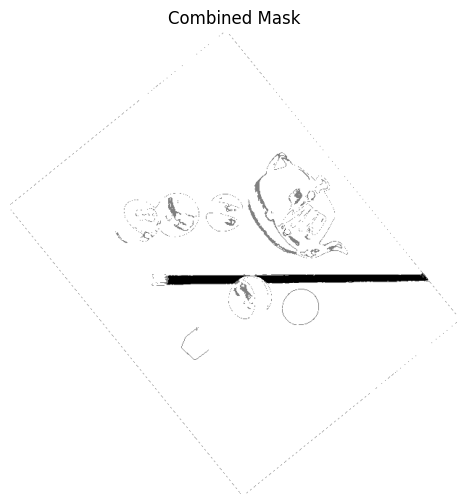

In [66]:
# Combine the Hue and Saturation masks
combined_tmp = cv2.addWeighted(saturation_tmp, 1, hue_tmp, 1, 1)

# Display the combined mask
plt.figure(figsize=(8, 6))
plt.imshow(combined_tmp, cmap='gray')
plt.title('Combined Mask')
plt.axis('off')
plt.show()

Isolating Black Pixels to Refine the Mask

The combined mask might still contain some noise or unwanted bright pixels. Since the billiard cue is likely to be a consistent color, the regions of interest in our combined mask should ideally be black (or very low values). We can create a final filter by setting pixels with values less than or equal to 1 to black (0) and all other pixels to white (255).

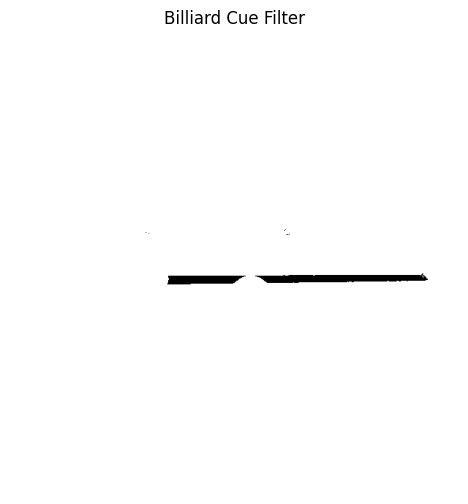

In [67]:
# Isolate black pixels to create the final billiard cue filter
billiard_cue_filter = np.where(combined_tmp <= 1, 0, 255)

# Display the final billiard cue filter
plt.figure(figsize=(8, 6))
plt.imshow(billiard_cue_filter, cmap='gray')
plt.title('Billiard Cue Filter')
plt.axis('off')
plt.show()

Applying the Mask to the Value Channel

Finally, we apply the created `billiard_cue_filter` to the **Value channel** of the original HSV image (`img_hsv`). The Value channel represents the intensity, and by using the mask derived from the color information (Hue and Saturation), we can isolate the intensity information specifically for the billiard cue. Where the mask is white (255), we keep the original Value channel pixel value; where the mask is black (0), we set the Value channel pixel value to 0.

We then compare the isolated Value channel of the billiard cue with the target grayscale image.

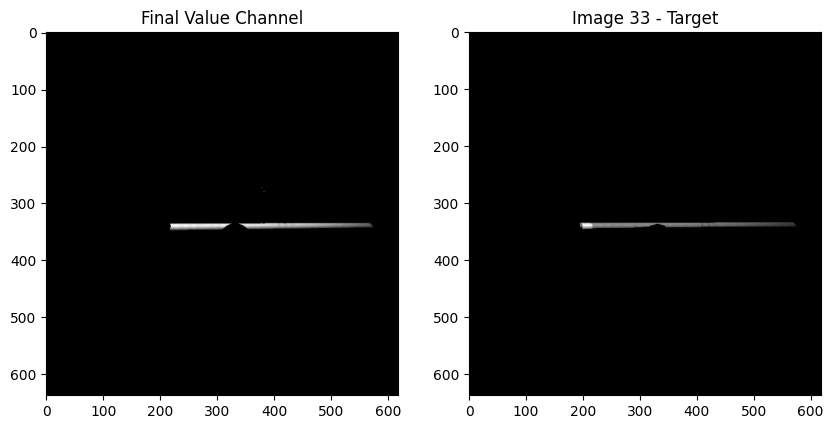

In [68]:
# Apply the mask to the Value channel
final_value = np.where(combined_tmp <= 1,value,0)

# Display the final Value channel and the target image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(final_value, cmap='gray')
plt.title('Final Value Channel')
plt.subplot(1, 2, 2)
plt.imshow(image33, cmap='gray')
plt.title('Image 33 - Target')
plt.show()

The only thing that we missed is the white edge in the front part of the cue.

---
---
---